In [1]:
import scanpy as sc
import squidpy as sq

import numpy as np
import pandas as pd

adata = sc.read_h5ad('datasets/slideseqv2/slideseqv2_raw.h5ad')
adata = adata[:,adata.var['highly_variable_rank']<2000].copy()
sc.pp.filter_cells(adata,min_genes=20)

adata = adata.raw.to_adata()
sc.pp.filter_genes(adata,min_cells=50)
adata

AnnData object with n_obs × n_vars = 32838 × 14181
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster', 'n_genes'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'deconvolution_results', 'spatial'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [2]:
from simvi.model import SimVI
SimVI.setup_anndata(adata)
edge_index = SimVI.extract_edge_index(adata,n_neighbors=10)
from pytorch_lightning.utilities.seed import seed_everything
seed_everything(0)
model = SimVI(adata,kl_weight=1,kl_gatweight=0.01,lam_mi=1000,permutation_rate=0.5,n_spatial=20,n_intrinsic=20)

adata.obsm['simvi_z'] = np.load('Benchmarking_results/slide-seqv2/simvi2k_z2.npy')
adata.obsm['simvi_s'] = np.load('Benchmarking_results/slide-seqv2/simvi2k_s2.npy')

adata.obsm['deconvolution_results_'] = adata.obsm['deconvolution_results'].iloc[:,0:14].copy()

pos_indices, se_list, r2_zlist, r2_slist, r2_zpvlist, r2_spvlist, S = model.get_se(edge_index,adata=adata,num_arch =20, Kfold=1,eps=1e-10,obsm_label='deconvolution_results_',positivity_filter=True,transformation='none')


Global seed set to 0
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/usr/local/lib/python3.8/dist-packages/scvi/data/fields/_layer_field.py:78: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
Global seed set to 0
2024-04-01 08:09:43.760623: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/app/SimVI_Project/simvi/model/simvi.py:586: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.loc[df.sum(axis=1)>0]


In [3]:
se = np.sum(se_list,axis=0)
se

array([[ 3.04764655e-02, -6.83429070e-03,  5.39992225e-04, ...,
         7.89835810e-03, -1.04610674e-02,  6.86417393e-03],
       [-9.60632884e-03,  9.05166577e-03, -3.34653200e-03, ...,
         2.14774946e-02, -1.68962624e-03,  2.43484549e-02],
       [ 2.32909199e-03, -1.37123656e-02,  2.70742936e-03, ...,
        -3.63205657e-03, -1.11756472e-02, -6.11881959e-03],
       ...,
       [-9.57814113e-03,  7.06824299e-03, -6.62395066e-03, ...,
        -1.13340678e-02, -2.70232084e-03,  8.90987856e-03],
       [-7.70166796e-03, -4.26584559e-03,  7.33959458e-05, ...,
        -4.57967359e-03, -5.38827867e-04, -4.29603312e-04],
       [-2.68610814e-03, -5.83101446e-03,  8.58468422e-04, ...,
         1.67528552e-02,  1.73457101e-02, -4.85141374e-03]])

In [4]:
adata.obs['Positivity'] = 'Infeasible'
adata.obs['Positivity'][pos_indices] = 'Feasible'

/tmp/ipykernel_3086241/3136968713.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['Positivity'][pos_indices] = 'Feasible'


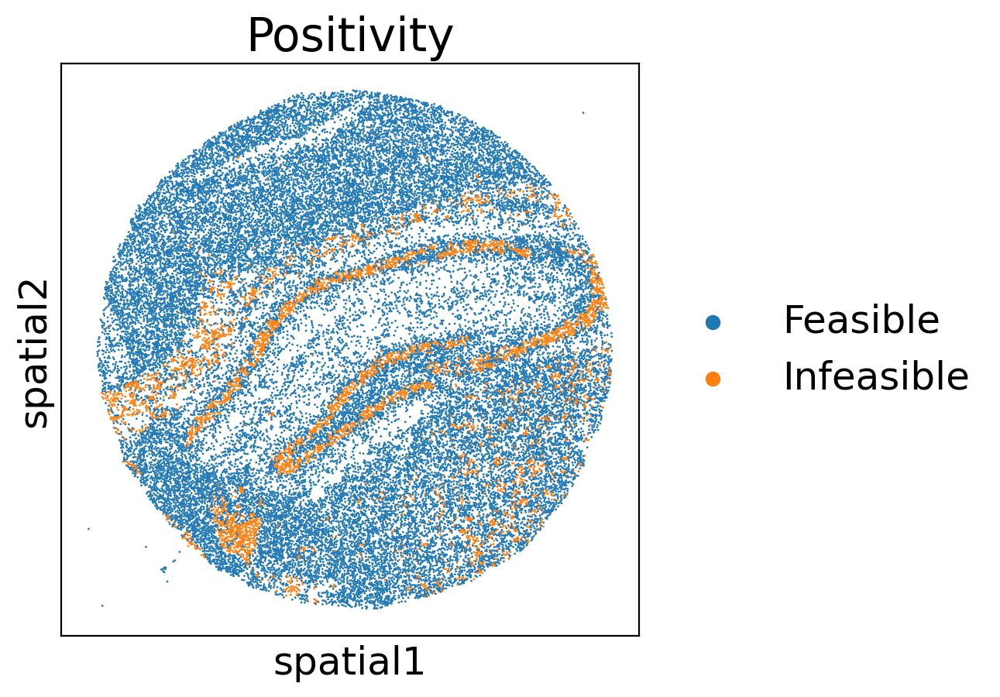

In [29]:
sc.pl.spatial(adata,color=['Positivity'],spot_size=20)

In [12]:
#se = np.sum(se_list,axis=0)
adata_se = adata[pos_indices].copy()
adata_se.X = se

/tmp/ipykernel_3086241/1616304979.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.var['class'][adata.var['r2_z']>0.2] = 'Cell-type specific'
/tmp/ipykernel_3086241/1616304979.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.var['class'][np.abs(adata.var['r2_s'].values - hr.predict(adata.var['r2_z'].values.reshape(-1,1)) ) / hr.scale_ > 100] = 'Spatial-induced'


Text(0.5, 1.0, '')

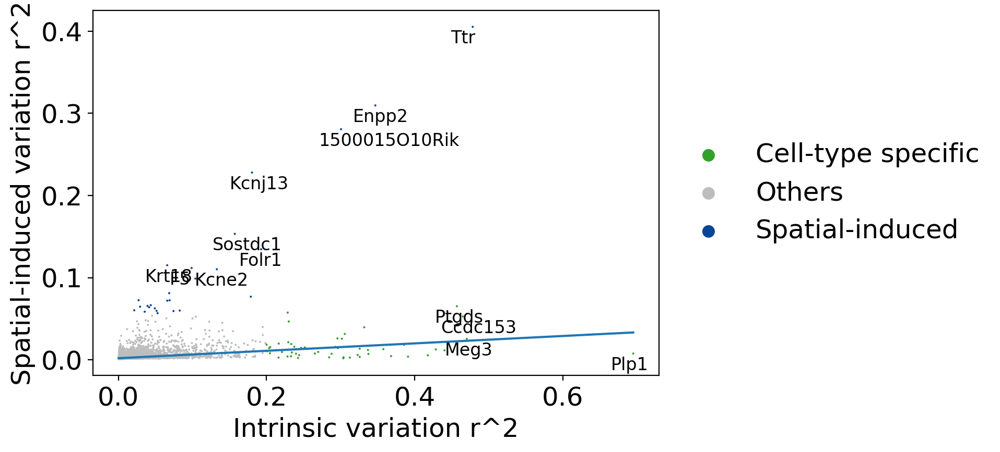

In [26]:
adata.var['r2_z'] = np.max(r2_zlist,axis=0)
adata.var['r2_s'] = np.max(r2_slist,axis=0)

from sklearn.linear_model import HuberRegressor

hr = HuberRegressor()
hr.fit(adata.var['r2_z'].values.reshape(-1,1),adata.var['r2_s'].values)


adata.var['class'] = 'Others'

adata.var['class'][adata.var['r2_z']>0.2] = 'Cell-type specific'
adata.var['class'][np.abs(adata.var['r2_s'].values - hr.predict(adata.var['r2_z'].values.reshape(-1,1)) ) / hr.scale_ > 100] = 'Spatial-induced'

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
plt.rcParams["font.size"] = 18

adata.uns['class_colors'] = ['#33a02c','#bdbdbd','#084594']




sc.pl.scatter(adata.copy(),x='r2_z',y='r2_s',show=False,color='class')
plt.plot(adata.var['r2_z'].values[np.argsort(adata.var['r2_z'].values)],hr.predict(adata.var['r2_z'].values.reshape(-1,1))[np.argsort(adata.var['r2_z'].values)])

for i in range(adata.var['r2_s'].shape[0]):
    if adata.var['r2_s'][i] > 0.1 or adata.var['r2_z'][i] > 0.45:
        plt.text(adata.var['r2_z'][i]-0.03,adata.var['r2_s'][i]-0.02,adata.var_names[i],fontsize=12)
        
plt.xlabel('Intrinsic variation r^2')
plt.ylabel('Spatial-induced variation r^2')
plt.title('')

#plt.savefig('figures/r2scatter_slideseqv2.pdf')

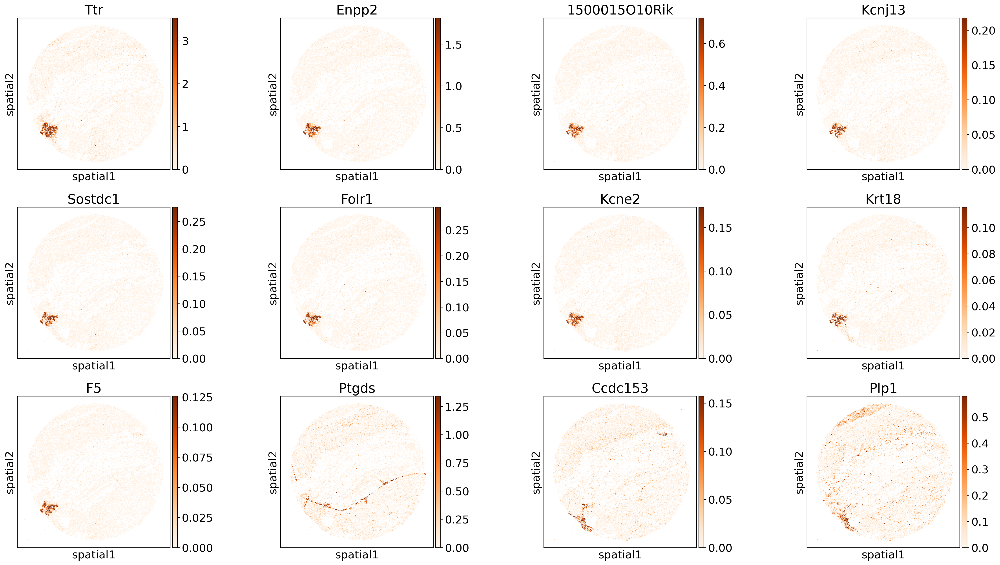

In [13]:
sc.pl.spatial(adata_se,color=['Ttr','Enpp2','1500015O10Rik','Kcnj13','Sostdc1','Folr1','Kcne2','Krt18','F5','Ptgds','Ccdc153','Plp1'],spot_size=20,vmax='p99.5',vmin=0,cmap='Oranges',use_raw=False,save='slideseqv2_se.png')

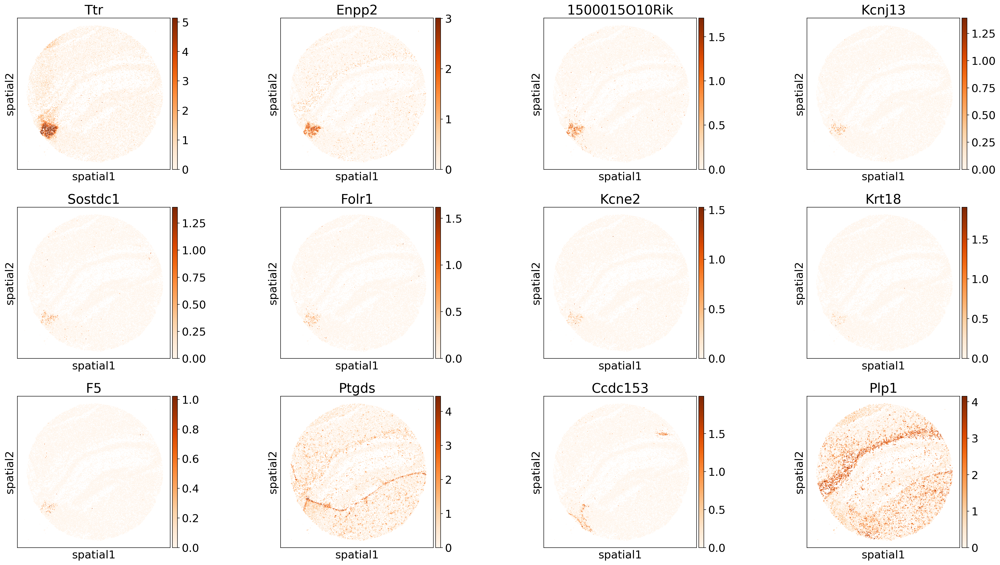

In [15]:
sc.pl.spatial(adata,color=['Ttr','Enpp2','1500015O10Rik','Kcnj13','Sostdc1','Folr1','Kcne2','Krt18','F5','Ptgds','Ccdc153','Plp1'],spot_size=20,vmin=0,cmap='Oranges',save='slideseqv2_ne.png')

In [58]:
df_summary = None

for res in [0.5,0.7,0.9,1.1]:
    sc.tl.leiden(adata,resolution=res)
    df = pd.DataFrame(S.copy())
    df = (df>0.5).astype(int)
    df['cluster'] = adata.obs['leiden'].values.copy()
    df = df.loc[df.sum(axis=1)>0]
    df_ = pd.DataFrame(df.groupby('cluster').mean().max(axis=0))
    if df_summary is None:
        df_summary = df_
    else:
        df_summary = pd.concat([df_summary,df_],axis=1)
        
df_summary.columns = [0.5,0.7,0.9,1.1]
df_summary
    
    

/tmp/ipykernel_3081411/2337359543.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.loc[df.sum(axis=1)>0]
/tmp/ipykernel_3081411/2337359543.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.loc[df.sum(axis=1)>0]
/tmp/ipykernel_3081411/2337359543.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.loc[df.sum(axis=1)>0]
/tmp/ipykernel_3081411/2337359543.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is depr

,0.5,0.7,0.9,1.1
0,0.190994,0.467681,0.457249,0.458955
1,0.321429,0.321429,0.357143,0.183673
2,0.761658,0.784810,0.774818,0.780669
3,0.140152,0.232394,0.269939,0.357724
4,0.957447,0.972705,0.978581,0.985366
5,0.117424,0.218310,0.625000,0.462687
6,0.092050,0.090535,0.095041,0.092050
7,0.001852,0.001938,0.002010,0.013514
8,0.026398,0.060837,0.070632,0.070896
9,0.001553,0.002660,0.002632,0.002660


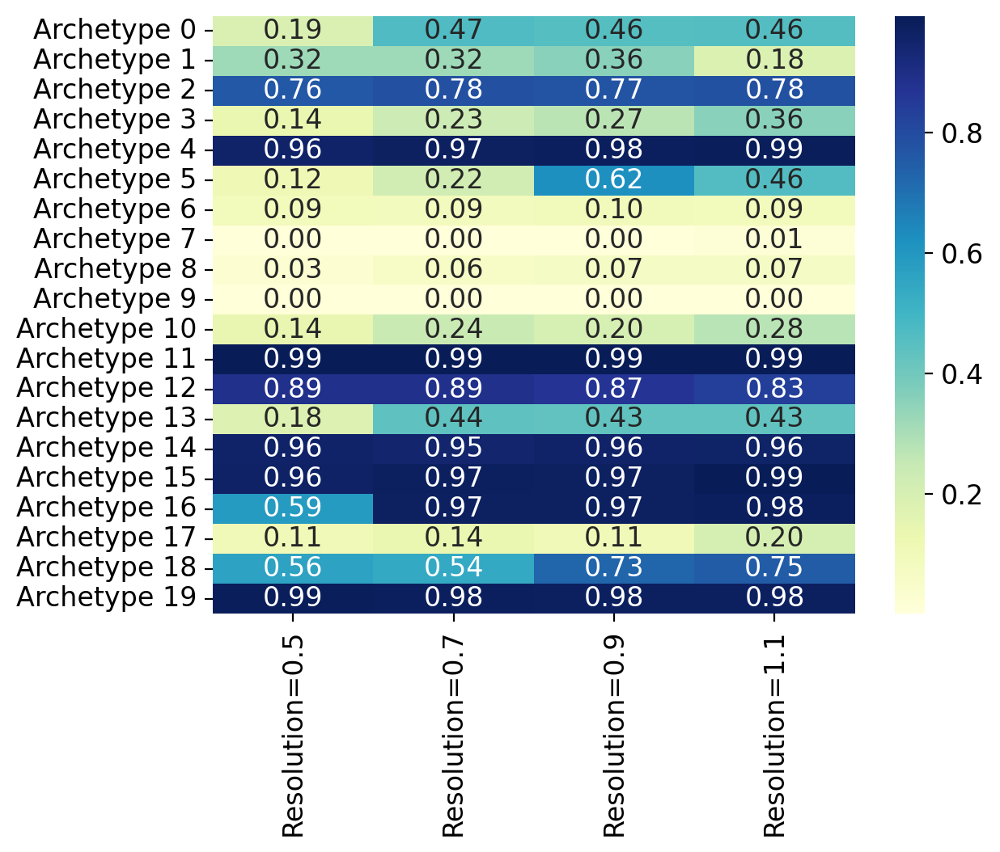

In [76]:
import seaborn as sns
plt.rcParams["font.size"] = 12

df_summary.index = ['Archetype '+str(i) for i in df_summary.index]
df_summary.columns = ['Resolution='+str(i) for i in df_summary.columns]
sns.heatmap(df_summary, annot=True, fmt=".2f", cmap="YlGnBu")
plt.savefig('figures/positivity_res.pdf')